# Spotify Network - Open Question

The objective for this section is using pre-trained models in order to identify the presence of homogeneous album covers pattern among Louvain communites in our graph, then training two CNN architectures for music genre predictions. More specifically:


1) We perfrom a concept modeling (topic modeling for images) considerign albums extracted from the artists in the graph. Then we will compare these results with pre-trained models taking into account the community identified through louvain

2) We use a pre-trained [Vision Transformer](https://huggingface.co/docs/transformers/model_doc/vit) model from hugging face in order to classify each artists' main album cover: our objective is checking if homogeneity in terms of image labels is present across communities

3) We use a modified pre-trained version of [AlexNet](https://github.com/fabiocarrara/visual-sentiment-analysis) for visual sentiment analysis, in order to evaluate if some communities present "more positive" album covers then others

4) We train two CNN on the extracted albums images labeled with genre cla

In [ ]:
#model the topics, then visualize them.

#considering the topics found and the related concepts how are they associated with the communities?

In [ ]:
from IPython.display import clear_output

In [ ]:
!pip install spotipy
!pip install wget
!pip install gdown
!pip install transformers
!pip3 install --upgrade alexnet_pytorch
!pip install concept
!pip install datasets

#!pip install 'cdlib[all]'
!pip install cdlib
!pip install ndlib

clear_output()

In [ ]:
#we will exploit the pre_trained weights in hybrid_finetuned_all (other weights are available from the same git-hub repo, and for VGG19 models)

!wget https://github.com/fabiocarrara/visual-sentiment-analysis/releases/download/torch-models/hybrid_finetuned_all.pth
#!wget https://github.com/fabiocarrara/visual-sentiment-analysis/releases/download/torch-models/hybrid_finetuned_fc6+.pth
#!wget https://github.com/fabiocarrara/visual-sentiment-analysis/releases/download/torch-models/vgg19_finetuned_all.pth
#!wget https://github.com/fabiocarrara/visual-sentiment-analysis/releases/download/torch-models/vgg19_finetuned_fc6+.pth

clear_output()

In [ ]:
#note, cuda is required for AlexNet execution

from PIL import Image
import requests
from torchvision.io import read_image
import torchvision.transforms as transforms
import torchvision.transforms.functional as F_
import base64
import io
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets.folder import default_loader
import cv2

from scipy.stats import spearmanr

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import pickle

from transformers import ViTImageProcessor, ViTForImageClassification
import requests

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import glob



from tqdm import tqdm

In [ ]:
torch.cuda.is_available()

True

In [ ]:
with open("artists_graph_20.pickle", 'rb') as f:
    G = pickle.load(f)

In [ ]:
with open("louvain_communities.pickle", 'rb') as f:
    louvain_communities = pickle.load(f)

In [ ]:
#we hide the client id and client secret for privacy reason

client_id = ''
client_secret = ''

credmanager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=credmanager)

In [ ]:
G.nodes['Tyler, The Creator']

{'artist_name': 'Tyler, The Creator',
 'artist_id': '4V8LLVI7PbaPR0K2TGSxFF',
 'artist_first_genre': ['hip hop', 'rap', 'genre_not_available'],
 'artist_popularity': 84,
 'artist_n_followers': 12130268,
 'related_found': True,
 'main_genre': 'hip hop'}

In [ ]:
tyler_album = sp.artist_albums(artist_id = G.nodes['Tyler, The Creator']['artist_id'])

In [ ]:
tyler_album['items'][0]['images'][0]['url']
url = tyler_album['items'][0]['images'][0]['url']

In [ ]:
url

'https://i.scdn.co/image/ab67616d0000b273aa95a399fd30fbb4f6f59fca'

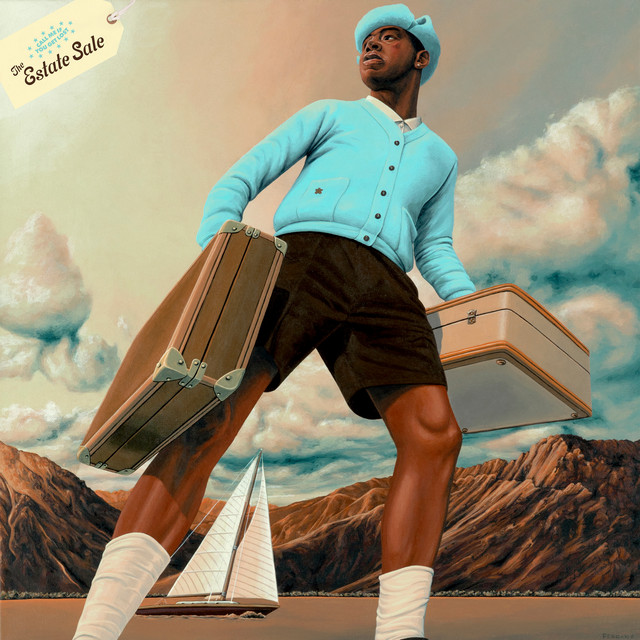

In [ ]:
image = Image.open(requests.get(url, stream=True).raw)
image

In [ ]:
#the function is used to extract the first album image for every node in the community
def community_albums(G, community):
  #for each node in the community, extract the image and assign a name to the image
  for node in community:
    artist_id = G.nodes[node]['artist_id']

    try:

      node_album = sp.artist_albums(artist_id = G.nodes[node]['artist_id'])
      url = node_album['items'][0]['images'][0]['url']
      image = Image.open(requests.get(url, stream=True).raw)
      image.save('spotify_albums_1/{}.jpg'.format(artist_id))

    except:
      continue

In [ ]:
from huggingface_hub import hf_hub_download

In [ ]:
#alternatively you can import the entire .zip containing the images with the following code block using hugging face
from huggingface_hub import hf_hub_download
hf_hub_download(repo_id="PwNzDust/sna_spotify_album", filename="spotify_albums_1.zip", local_dir='content')
!unzip content/spotify_albums_1.zip
clear_output()

In [ ]:
for i, community in enumerate(louvain_communities.communities):
  community_albums(G,community)

In [ ]:
img_names = list(glob.glob('content/spotify_albums_1/*.jpg'))
artists_id_checked = [name[26:-4] for name in img_names]
len(artists_id_checked)

63415

We predict for each album associated to one of the artists its visual content based on ViTImageProcessor

In [ ]:
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

In [ ]:
id = G.nodes['Kali Uchis']['artist_id']
image = Image.open("content/spotify_albums_1/{}.jpg".format(id))
inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits

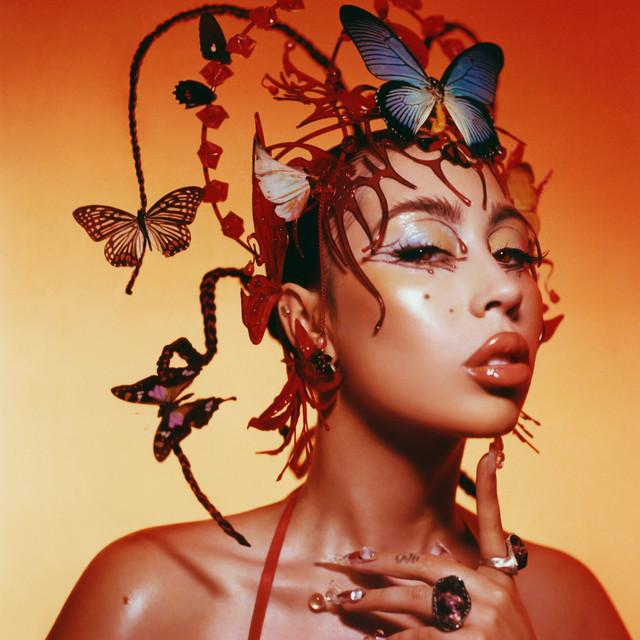

In [ ]:
image

In [ ]:
predicted_class_idx = logits.argmax(-1).item()
model.config.id2label[predicted_class_idx]

'lipstick, lip rouge'

In [ ]:
#for each node if possible we find the class associate to the artist's main album
k= 0
for node in still_to_check:
    try:
      id = G.nodes[node]['artist_id']
      image = Image.open(r"content/spotify_albums_1/{}.jpg".format(id))
      inputs = processor(images=image, return_tensors="pt")
      outputs = model(**inputs)
      logits = outputs.logits

      predicted_class_idx = logits.argmax(-1).item()
      class_ = model.config.id2label[predicted_class_idx]

      G.nodes[node]['predicted_class'] = class_
    except:
      G.nodes[node]['predicted_class'] = None


    k+=1


In [ ]:
pickle.dump(G, open('artists_graph_20_album_class.pickle', 'wb'))

In [ ]:
with open("artists_graph_20_album_class.pickle", 'rb') as f:
    G = pickle.load(f)

#### Code for converted alexnet

Following https://github.com/fabiocarrara/visual-sentiment-analysis, we implement their modified AlexNet class and load the pre_trained weights for visual sentiment classification

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

__weights_dict = dict()

def load_weights(weight_file):
    if weight_file == None:
        return

    try:
        weights_dict = np.load(weight_file, allow_pickle=True).item()
    except:
        weights_dict = np.load(weight_file, encoding='bytes', allow_pickle=True).item()

    return weights_dict

class KitModel(nn.Module):


    def __init__(self, weight_file):
        super(KitModel, self).__init__()
        global __weights_dict
        __weights_dict = load_weights(weight_file)

        self.conv1 = self.__conv(2, name='conv1', in_channels=3, out_channels=96, kernel_size=(11, 11), stride=(4, 4), groups=1, bias=True)
        self.conv2 = self.__conv(2, name='conv2', in_channels=96, out_channels=256, kernel_size=(5, 5), stride=(1, 1), groups=2, bias=True)
        self.conv3 = self.__conv(2, name='conv3', in_channels=256, out_channels=384, kernel_size=(3, 3), stride=(1, 1), groups=1, bias=True)
        self.conv4 = self.__conv(2, name='conv4', in_channels=384, out_channels=384, kernel_size=(3, 3), stride=(1, 1), groups=2, bias=True)
        self.conv5 = self.__conv(2, name='conv5', in_channels=384, out_channels=256, kernel_size=(3, 3), stride=(1, 1), groups=2, bias=True)
        self.fc6_1 = self.__dense(name = 'fc6_1', in_features = 9216, out_features = 4096, bias = True)
        self.fc7_1 = self.__dense(name = 'fc7_1', in_features = 4096, out_features = 4096, bias = True)
        self.fc8_retrain_1 = self.__dense(name = 'fc8-retrain_1', in_features = 4096, out_features = 3, bias = True)

    def forward(self, x):
        conv1_pad       = F.pad(x, (0, 1, 0, 1))
        conv1           = self.conv1(conv1_pad)
        relu1           = F.relu(conv1)
        norm1           = F.local_response_norm(relu1, size=5, alpha=9.999999747378752e-05, beta=0.75, k=1.0)
        pool1_pad       = F.pad(norm1, (0, 1, 0, 1), value=float('-inf'))
        pool1           = F.max_pool2d(pool1_pad, kernel_size=(3, 3), stride=(2, 2), padding=0, ceil_mode=False)
        conv2_pad       = F.pad(pool1, (2, 2, 2, 2))
        conv2           = self.conv2(conv2_pad)
        relu2           = F.relu(conv2)
        norm2           = F.local_response_norm(relu2, size=5, alpha=9.999999747378752e-05, beta=0.75, k=1.0)
        pool2_pad       = F.pad(norm2, (0, 1, 0, 1), value=float('-inf'))
        pool2           = F.max_pool2d(pool2_pad, kernel_size=(3, 3), stride=(2, 2), padding=0, ceil_mode=False)
        conv3_pad       = F.pad(pool2, (1, 1, 1, 1))
        conv3           = self.conv3(conv3_pad)
        relu3           = F.relu(conv3)
        conv4_pad       = F.pad(relu3, (1, 1, 1, 1))
        conv4           = self.conv4(conv4_pad)
        relu4           = F.relu(conv4)
        conv5_pad       = F.pad(relu4, (1, 1, 1, 1))
        conv5           = self.conv5(conv5_pad)
        relu5           = F.relu(conv5)
        pool5_pad       = F.pad(relu5, (0, 1, 0, 1), value=float('-inf'))
        pool5           = F.max_pool2d(pool5_pad, kernel_size=(3, 3), stride=(2, 2), padding=0, ceil_mode=False)
        fc6_0           = pool5.view(pool5.size(0), -1)
        fc6_1           = self.fc6_1(fc6_0)
        relu6           = F.relu(fc6_1)
        drop6           = F.dropout(input = relu6, p = 0.5, training = self.training, inplace = True)
        fc7_0           = drop6.view(drop6.size(0), -1)
        fc7_1           = self.fc7_1(fc7_0)
        relu7           = F.relu(fc7_1)
        drop7           = F.dropout(input = relu7, p = 0.5, training = self.training, inplace = True)
        fc8_retrain_0   = drop7.view(drop7.size(0), -1)
        fc8_retrain_1   = self.fc8_retrain_1(fc8_retrain_0)
        softmax         = F.softmax(fc8_retrain_1)
        return softmax


    @staticmethod
    def __conv(dim, name, **kwargs):
        if   dim == 1:  layer = nn.Conv1d(**kwargs)
        elif dim == 2:  layer = nn.Conv2d(**kwargs)
        elif dim == 3:  layer = nn.Conv3d(**kwargs)
        else:           raise NotImplementedError()

        layer.state_dict()['weight'].copy_(torch.from_numpy(__weights_dict[name]['weights']))
        if 'bias' in __weights_dict[name]:
            layer.state_dict()['bias'].copy_(torch.from_numpy(__weights_dict[name]['bias']))
        return layer

    @staticmethod
    def __dense(name, **kwargs):
        layer = nn.Linear(**kwargs)
        layer.state_dict()['weight'].copy_(torch.from_numpy(__weights_dict[name]['weights']))
        if 'bias' in __weights_dict[name]:
            layer.state_dict()['bias'].copy_(torch.from_numpy(__weights_dict[name]['bias']))
        return layer

#### AlexNet eval and predictions


In [ ]:
AlexNet = KitModel

#a GPU is required for the evaluation to run
model = AlexNet
model = model('hybrid_finetuned_all.pth').to('cuda')
model.eval()

In [ ]:
from PIL import Image
import requests
from torchvision.io import read_image
import torchvision.transforms as transforms
import torchvision.transforms.functional as F_

from torch.utils.data import Dataset, DataLoader
from torchvision.datasets.folder import default_loader
from tqdm import tqdm


In [ ]:
id = G.nodes['Frank Ocean']['artist_id']
pil_image = Image.open(r"content/spotify_albums_1/{}.jpg".format(id))
pil_image = pil_image.convert('RGB')
image = F_.to_tensor(F_.resize(pil_image, (224, 224)))  # resize to 224
image = image[[2,1,0]] * 255 # RGB -> BGR (expected by caffe nets), [0,1] -> [0, 255]

In [ ]:
image.unsqueeze(0)

tensor([[[[255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          ...,
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.]],

         [[255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          ...,
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.]],

         [[255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          ...,
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ..., 255., 255., 255.],
          [255., 255., 255.,  ...

In [ ]:
sents = model(image.unsqueeze(0).to('cuda'))

<ipython-input-24-f2ded8cf612b>:70: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  softmax         = F.softmax(fc8_retrain_1)


In [ ]:
(sents.cpu().detach().numpy()) # order is (NEG, NEU, POS)

array([[0.6754845 , 0.14851582, 0.17599967]], dtype=float32)

In [ ]:
#majority label
np.argmax((sents.cpu().detach().numpy()))

0

In [ ]:
#for each node if possible we find the class associate to the artist's main album
k= 0
for node in still_to_check:
    try:

      id = G.nodes[node]['artist_id']
      pil_image = Image.open(r"content/spotify_albums_1/{}.jpg".format(id))
      pil_image = pil_image.convert('RGB')
      image = F_.to_tensor(F_.resize(pil_image, (224, 224)))  # resize to 224
      image = image[[2,1,0]] * 255 # RGB -> BGR (expected by caffe nets), [0,1] -> [0, 255]

      sents = model(image.unsqueeze(0).to('cuda'))
      (sents.cpu().detach().numpy()) # order is (NEG, NEU, POS)
      class_ = np.argmax((sents.cpu().detach().numpy()))


      G.nodes[node]['predicted_label'] = class_
    except:
      G.nodes[node]['predicted_label'] = None


    k+=1

In [ ]:
pickle.dump(G, open('artists_graph_20_album_class.pickle', 'wb'))

In [ ]:
with open("artists_graph_20_album_class.pickle", 'rb') as f:
    G = pickle.load(f)

### Album class and sentiment analysis


In [ ]:
with open("artists_graph_20_album_class.pickle", 'rb') as f:
    G = pickle.load(f)

In [ ]:
G.nodes['Tyler, The Creator']

{'artist_name': 'Tyler, The Creator',
 'artist_id': '4V8LLVI7PbaPR0K2TGSxFF',
 'artist_first_genre': ['hip hop', 'rap', 'genre_not_available'],
 'artist_popularity': 84,
 'artist_n_followers': 12130268,
 'related_found': True,
 'main_genre': 'hip hop',
 'predicted_class': 'broom',
 'predicted_label': 1}

In [ ]:
def community_purity(G, method, attr):
  #we evaluate how pure each community is
  purities = []
  num_nodes = len(set(sum(method.communities, [])))
  for c in method.communities:
    attr_list = []
    for node in c:
      attr_list.append(G.nodes[node][attr])

    cnt = Counter(attr_list)
    purity = max(cnt.values())/sum(cnt.values())
    purities.append((purity, len(c)))

  return purities

def main_genre_community(community, genres):
  genres_lists = [G.nodes[node]['artist_first_genre'] for node in community]
  genres_lists = [x[:-1] if len(x) > 1 else x for x in genres_lists]

  genres_dist = {genre : 0 for genre in genres}
  countings = [(genre,len([0 for genre_list in genres_lists if genre in genre_list])) for genre in genres]
  countings = [(tup[0], tup[1] * 100 / len(genres_lists)) for tup in countings]

  return sorted(countings, key=lambda x: x[1], reverse = True)

In [ ]:
#find the puritiy values in terms of genre, predicted image content and sentiment for communities larger then 3

louvain_purities = community_purity(G, louvain_communities,'main_genre')
louvain_purities = [x[0] for x in louvain_purities if x[1] > 3]

louvain_purities_image = community_purity(G, louvain_communities,'predicted_class')
louvain_purities_image = [x[0] for x in louvain_purities_image if x[1] > 3]

louvain_purities_sentiment = community_purity(G, louvain_communities,'predicted_label')
louvain_purities_sentiment = [x[0] for x in louvain_purities_sentiment if x[1] > 3]

In [ ]:
correlation_coefficient, p_value = spearmanr(louvain_purities_image, louvain_purities)
print('Spearman correlation and p_value for class_image and genre purity', correlation_coefficient, p_value)

correlation_coefficient, p_value = spearmanr(louvain_purities_sentiment, louvain_purities)
print('Spearman correlation and p_value for sentiment image and genre purity', correlation_coefficient, p_value)

correlation_coefficient, p_value = spearmanr(louvain_purities_sentiment, louvain_purities_image)
print('Spearman correlation and p_value for class_image and sentiment image purity', correlation_coefficient, p_value)

Spearman correlation and p_value for class_image and genre purity -0.07559371574716844 0.5370096152641226
Spearman correlation and p_value for sentiment image and genre purity 0.07774936061381074 0.525429494367299
Spearman correlation and p_value for class_image and sentiment image purity 0.14775301424917794 0.22567711634811413


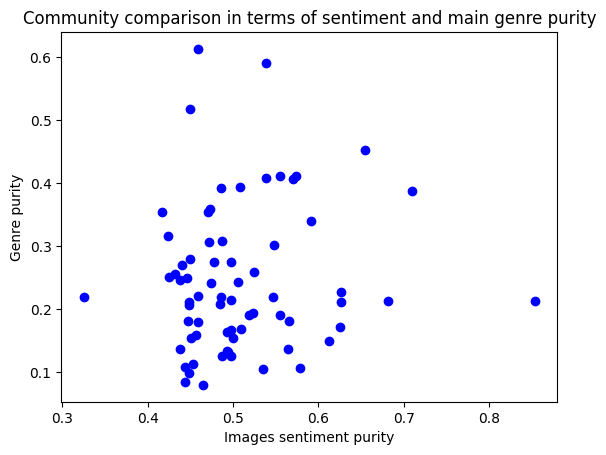

In [ ]:
plt.scatter(louvain_purities_sentiment, louvain_purities, color='blue', marker='o')

plt.xlabel('Images sentiment purity')
plt.ylabel('Genre purity')
plt.title('Community comparison in terms of sentiment and main genre purity')
plt.show()

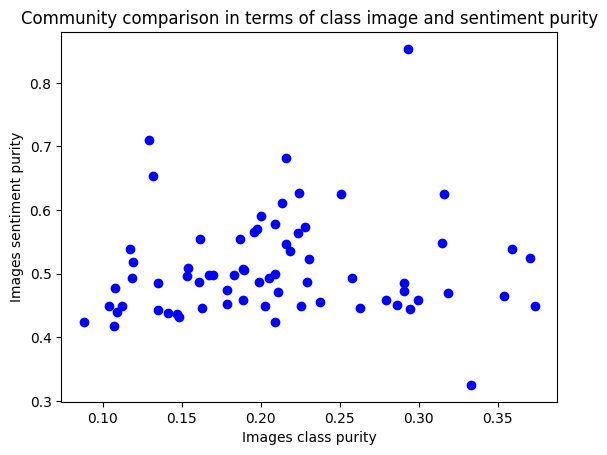

In [ ]:
plt.scatter(louvain_purities_image, louvain_purities_sentiment, color='blue', marker='o')

plt.xlabel('Images class purity')
plt.ylabel('Images sentiment purity')
plt.title('Community comparison in terms of class image and sentiment purity')
plt.show()

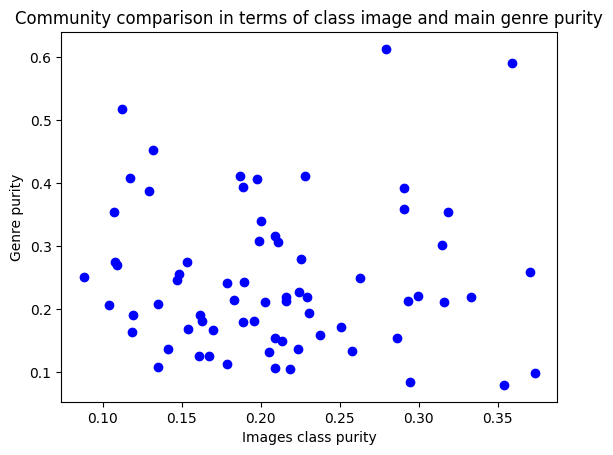

In [ ]:
plt.scatter(louvain_purities_image, louvain_purities, color='blue', marker='o')

plt.xlabel('Images class purity')
plt.ylabel('Genre purity')
plt.title('Community comparison in terms of class image and main genre purity')
plt.show()

In [ ]:
genres_lists = [G.nodes[node]['artist_first_genre'] for node in G.nodes()]

In [ ]:
genres = set(sum([G.nodes[node]['artist_first_genre'] for node in list(G.nodes())],[]))

In [ ]:
#for each community we see the top 5 genres w.r.t. the genre lists
genre_com_dict = { i : (main_genre_community(community, genres)[:5],len(community)) for i, community in enumerate(louvain_communities.communities) if len(community) > 2}

In [ ]:
#check the 5 most pure communities in terms of sentiment
purest_sentiment = np.array(louvain_purities_sentiment).argsort()[-10:][::-1]
purest_sentiment, np.array(louvain_purities_sentiment)[purest_sentiment]

(array([47, 67, 21, 57,  4, 40, 37, 36, 61, 14]),
 array([0.85333333, 0.70967742, 0.68128917, 0.65408805, 0.62691415,
        0.62602965, 0.62536873, 0.6119186 , 0.59130435, 0.57876944]))

In [ ]:
# order is (NEG, NEU, POS)

for index in purest_sentiment:
  sentiments_list = [G.nodes[node]['predicted_label'] for node in louvain_communities.communities[index]]
  sentiments_list = np.array([x for x in sentiments_list if x is not None]) #TO REMOVE!!!!!
  print(index, np.unique(sentiments_list, return_counts=True), end = '\n\n')


47 (array([0, 1, 2]), array([  5,  60, 384]))

67 (array([0, 1, 2]), array([ 3, 15, 44]))

21 (array([0, 1, 2]), array([ 43, 313, 761]))

57 (array([0, 1, 2]), array([ 11,  44, 104]))

4 (array([0, 1, 2]), array([ 168,  625, 1351]))

40 (array([0, 1, 2]), array([ 31, 194, 380]))

37 (array([0, 1, 2]), array([ 35, 184, 424]))

36 (array([0, 1, 2]), array([ 34, 229, 421]))

61 (array([0, 1, 2]), array([17, 30, 68]))

14 (array([0, 1, 2]), array([103, 512, 856]))



In [ ]:
for index in purest_sentiment:
  print(genre_com_dict[index], end = '\n\n')


([('sertanejo', 31.11111111111111), ('sertanejo universitario', 29.77777777777778), ('sertanejo pop', 26.22222222222222), ('sertanejo tradicional', 18.666666666666668), ('arrocha', 13.11111111111111)], 450)

([('lagu jawa', 43.54838709677419), ('genre_not_available', 38.70967741935484), ('dangdut koplo', 27.419354838709676), ('javanese dangdut', 24.193548387096776), ('dangdut', 14.516129032258064)], 62)

([('musica mexicana', 23.903312444046552), ('norteno', 22.829006266786035), ('corrido', 21.486123545210386), ('banda', 21.307072515666967), ('sierreno', 16.56222023276634)], 1117)

([('albanian pop', 59.74842767295598), ('albanian hip hop', 28.930817610062892), ('tallava', 20.754716981132077), ('kosovan pop', 14.465408805031446), ('genre_not_available', 6.289308176100629)], 159)

([('genre_not_available', 22.784222737819025), ('punjabi pop', 11.879350348027842), ('filmi', 11.368909512761022), ('modern bollywood', 9.883990719257541), ('desi pop', 6.357308584686775)], 2155)

([('funk mtg

In [ ]:
#check the 5 most pure communities in terms of image labels
purest_images = np.array(louvain_purities_image).argsort()[-5:][::-1]

purest_images, np.array(louvain_purities_image)[purest_images]

(array([15, 59, 68, 42, 60]),
 array([0.37351916, 0.37062937, 0.35897436, 0.35409253, 0.33333333]))

In [ ]:
for index in purest_images:
  image_lists = [G.nodes[node]['predicted_class'] for node in louvain_communities.communities[index]]
  image_lists = np.array([x for x in image_lists if x is not None]) #TO REMOVE!!!!!
  image_lists = ([(class_label, frequency) for class_label, frequency in zip(np.unique(image_lists, return_counts=True)[0],np.unique(image_lists, return_counts=True)[1])])
  image_lists =  sorted(image_lists, key=lambda x: x[1], reverse = True)
  print(image_lists[0:5], end = '\n\n')



[('book jacket, dust cover, dust jacket, dust wrapper', 536), ('web site, website, internet site, site', 255), ('cello, violoncello', 41), ('comic book', 40), ('violin, fiddle', 25)]

[('comic book', 53), ('book jacket, dust cover, dust jacket, dust wrapper', 33), ('shield, buckler', 6), ('theater curtain, theatre curtain', 4), ('altar', 2)]

[('comic book', 14), ('book jacket, dust cover, dust jacket, dust wrapper', 4), ('electric guitar', 2), ('monitor', 2), ('slot, one-armed bandit', 2)]

[('book jacket, dust cover, dust jacket, dust wrapper', 199), ('comic book', 69), ('web site, website, internet site, site', 22), ('lakeside, lakeshore', 8), ('shield, buckler', 8)]

[('comic book', 41), ('web site, website, internet site, site', 11), ('book jacket, dust cover, dust jacket, dust wrapper', 10), ('packet', 4), ('Band Aid', 2)]



### Concept modeling analysis

In [ ]:
from concept import ConceptModel

  0%|          | 0.00/328M [00:00<?, ?B/s]

100%|██████████| 3/3 [00:11<00:00,  3.85s/it]


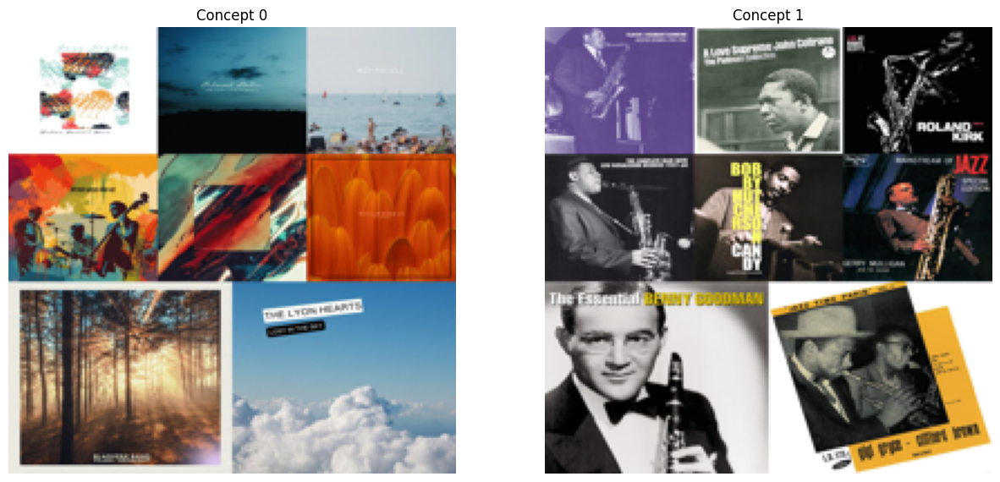

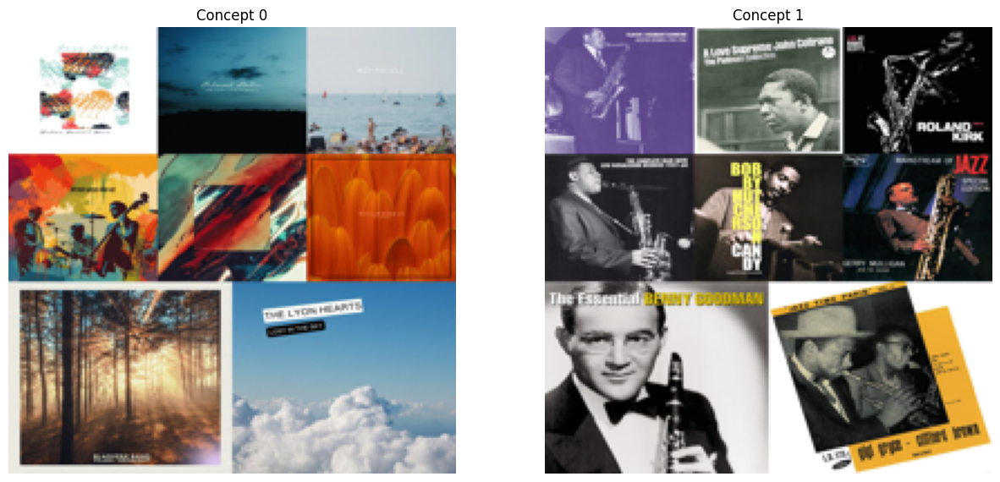

In [ ]:
#we display the value for the "jazz/bebop" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[54]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


100%|██████████| 7/7 [00:10<00:00,  1.52s/it]


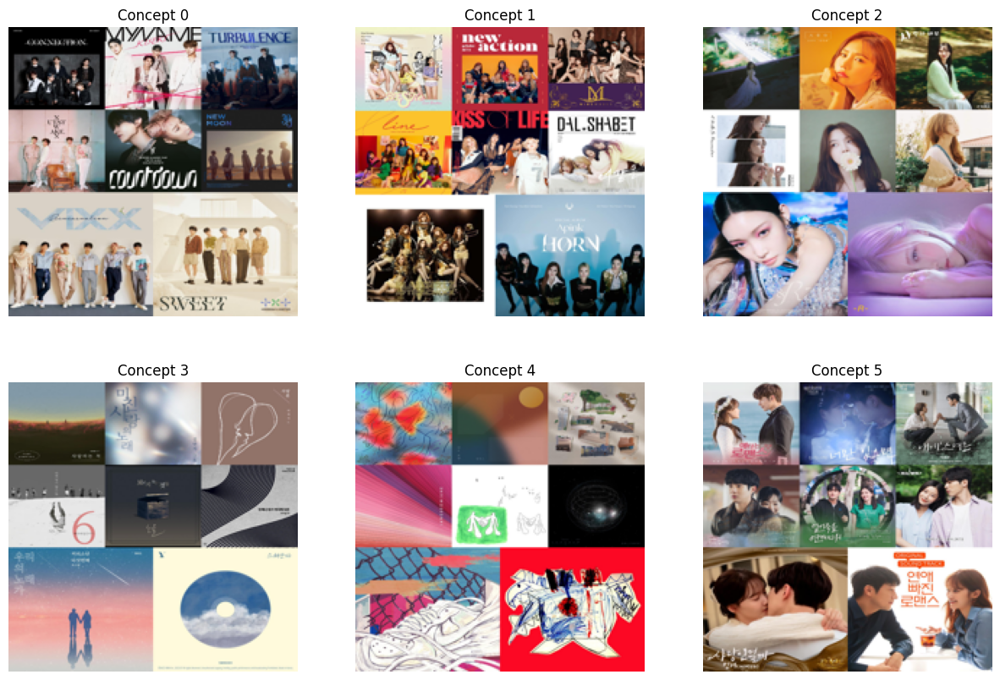

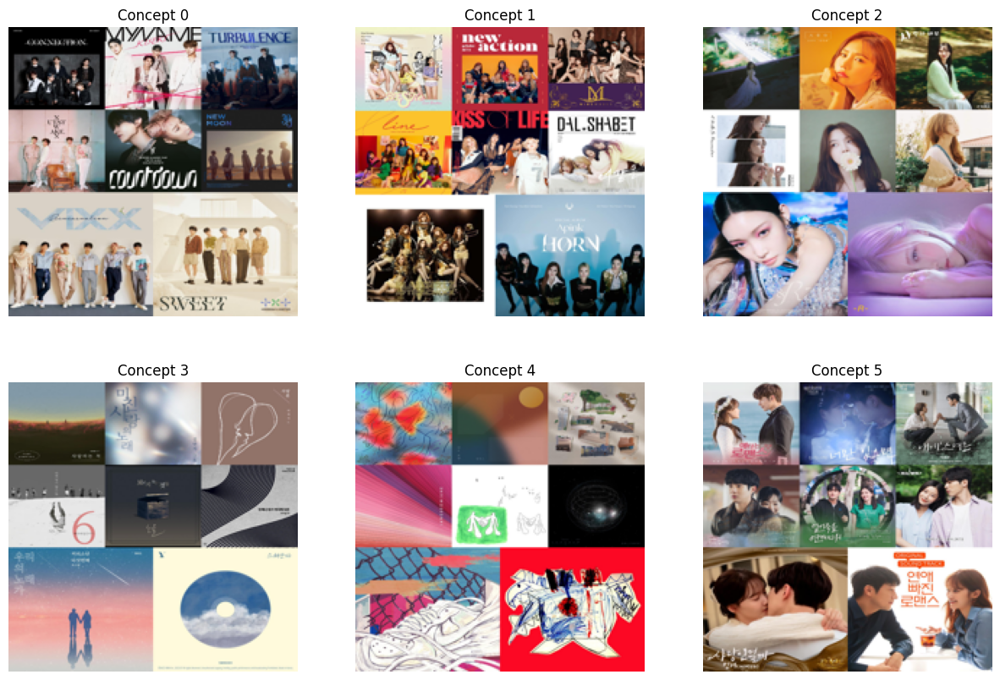

In [ ]:
#we display the value for the "k-pop" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[31]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


100%|██████████| 8/8 [00:12<00:00,  1.58s/it]


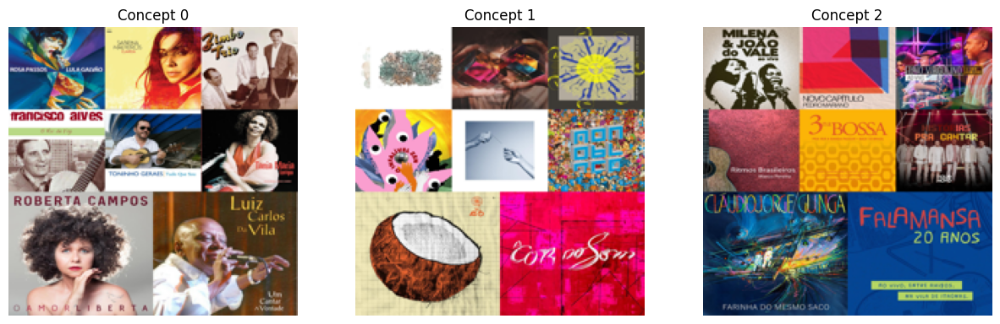

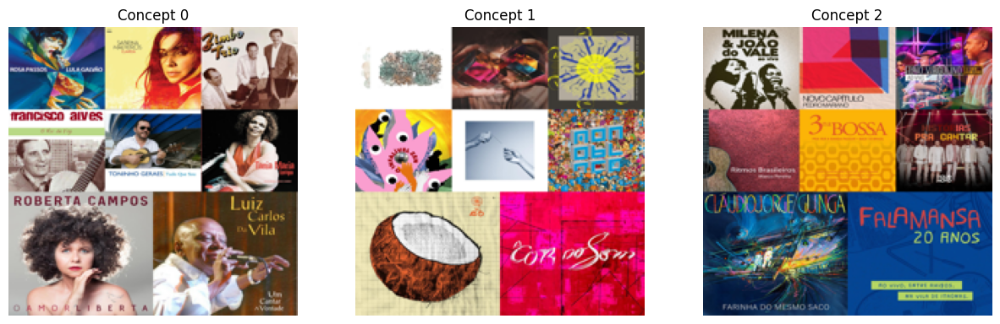

In [ ]:
#we display the value for the "samba/brasilian music" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[29]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


100%|██████████| 12/12 [00:18<00:00,  1.58s/it]


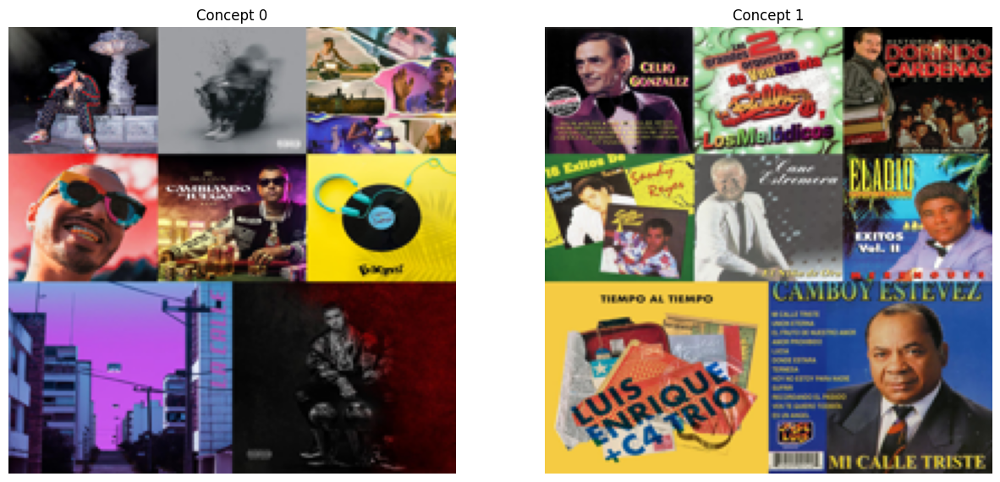

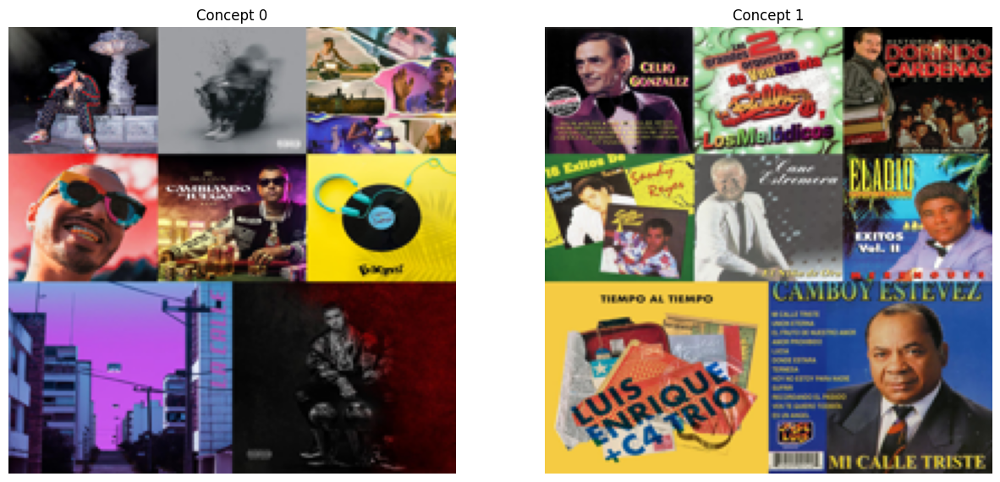

In [ ]:
#we display the value for the "urbano latino" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[14]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


100%|██████████| 28/28 [00:46<00:00,  1.65s/it]


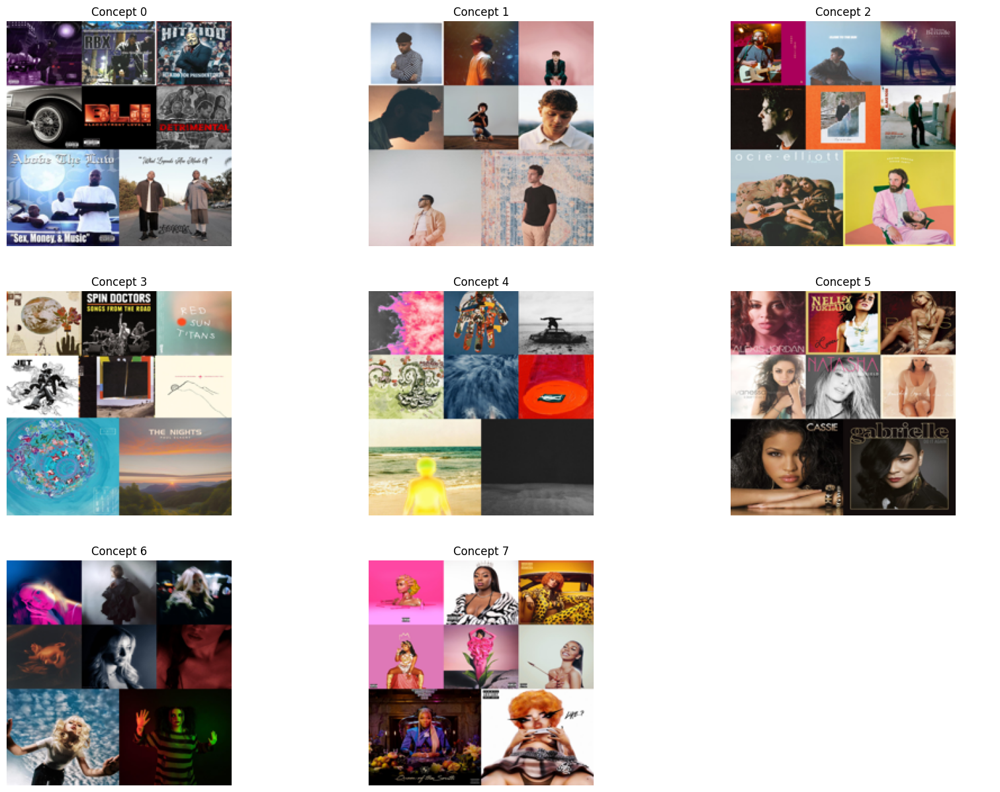

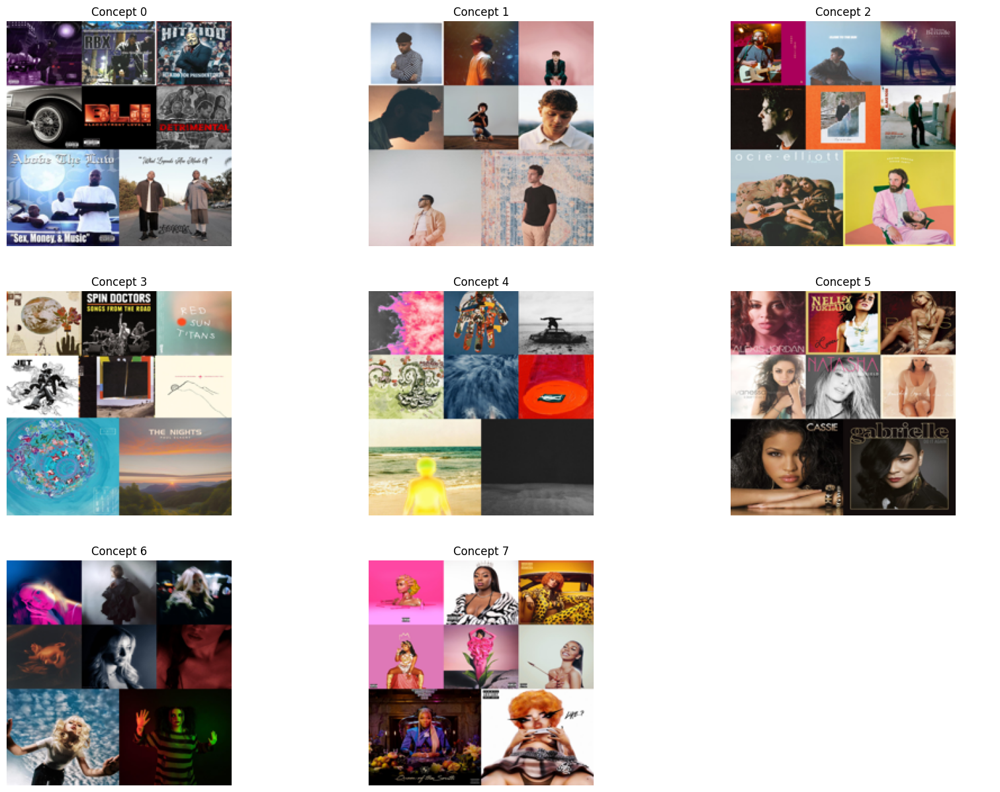

In [ ]:
#we display the value for the "pop/hip hop" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[0]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (20,15))


In [ ]:
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (20,5))

100%|██████████| 17/17 [00:27<00:00,  1.62s/it]


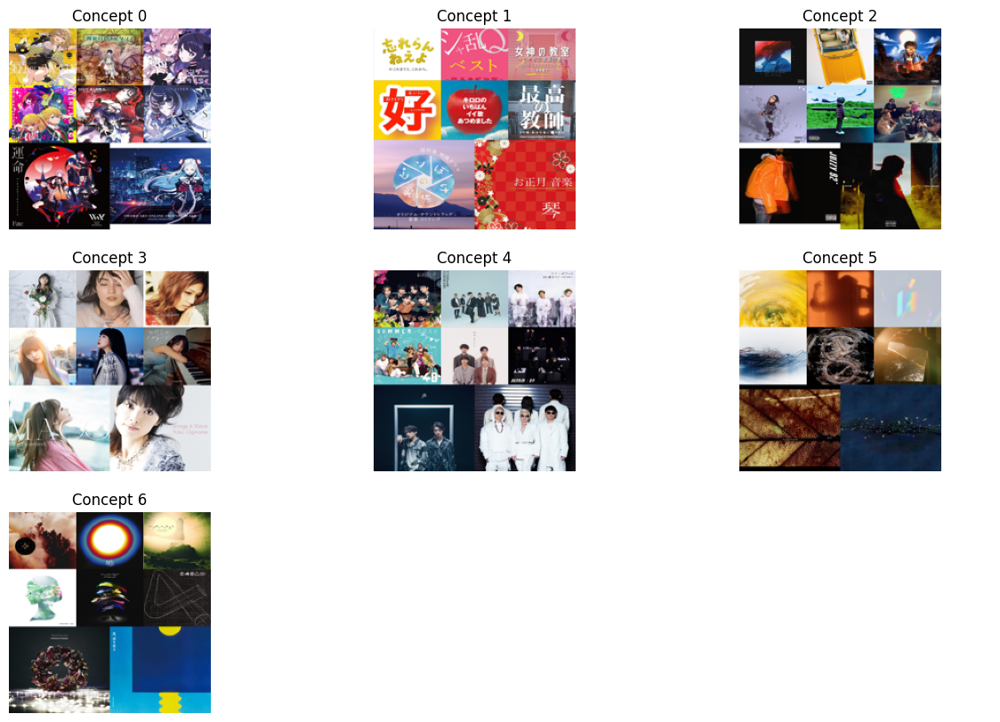

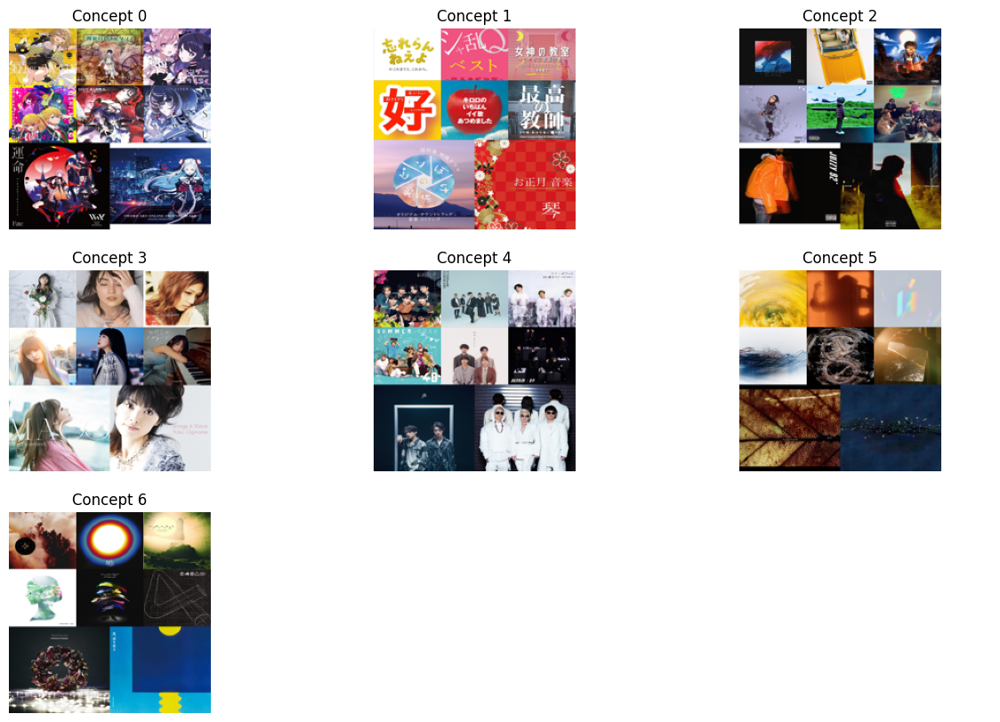

In [ ]:
#we display the value for the "j-pop/anime" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[3]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


100%|██████████| 15/15 [00:22<00:00,  1.48s/it]


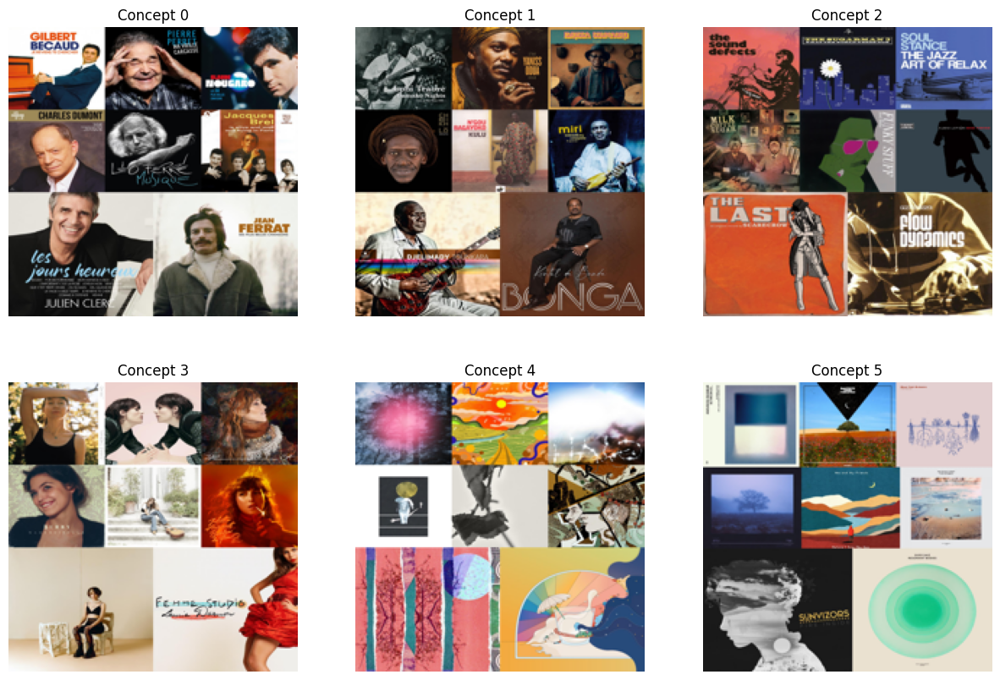

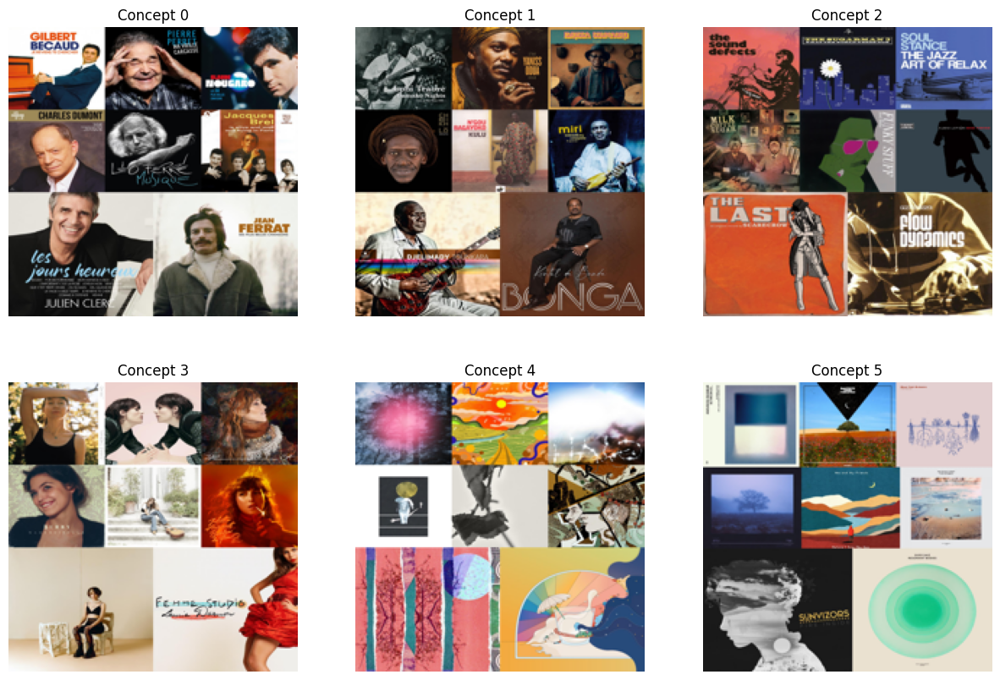

In [ ]:
#we display the value for the "french pop" community

community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[10]]
community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
community_ids = [i for i in img_names if i in community_ids]
len(community_ids)

concept_model = ConceptModel()
concepts = concept_model.fit_transform(community_ids)

set(concepts)
concept_model.visualize_concepts(concepts = [x for x in set(concepts) if x >= 0], figsize = (15,10))


#### Training a CNN to predict genre according to album covers

In [ ]:
#we consider sub-genres of pop as just pops, sub-genres of rock as just rock, sub-genres of rap as just rap

In [ ]:
community_to_genre_dictionary = {0 : 'pop', 1 : 'video_game', 2 : 'pop', 3: 'j-pop', 4 :'pop', 5 : 'rock', 6 : 'rap', 7 :'house', 8 :'country', 9:'trance',
                                 10: 'chanson', 11 : 'pop', 12 :'house', 13 :'metal', 14 : 'reggaeton', 15 : 'classical', 16 : 'synthwave', 17 : 'classical',
                                 18 : 'pop', 19: 'rap', 20 : 'phonk', 21 :'folk', 22 :'pop', 23: 'pop', 24 : 'pop', 25 : 'pop', 26 : 'rap', 27 : 'pop',
                                 28 : 'pop', 29 : 'folk', 30 : 'pop', 31 : 'k-pop', 32 : 'lo-fi beats', 33 : 'pop', 34 : 'musical', 35 : 'christian', 36 : 'rap',
                                 37 : 'musical', 38 : 'italian pop', 39 : 'rock', 40 : 'funk', 41 : 'pop', 42 : 'folk', 43 : 'house',  44 : 'pop', 45 : 'musical',
                                 46 : 'house', 47 :'folk', 48 : 'rock', 49 : 'pop', 50 : 'pop', 51 : 'pop', 52 : 'house', 53 : 'christian', 54 : 'jazz', 55 :'christian',
                                 56 : 'pop', 57 : 'pop', 58 : 'lullaby', 59 : 'metal', 60 : 'lullaby', 61 : 'pop', 62 : 'lo-fi beats', 63 : 'trance', 64 : 'pop', 65 : 'rap',
                                 66 : 'rock', 67 : 'folk', 68 : 'rock'}

image_set_strings = []
image_lables = []

In [ ]:
for index in range(len(louvain_communities.communities)):
  community_ids = [G.nodes[node]['artist_id'] for node in louvain_communities.communities[index]]
  if len(community_ids) < 3:
    continue
  community_ids = ['content/spotify_albums_1/{}.jpg'.format(id) for id in community_ids]
  lables = [community_to_genre_dictionary[index] for _ in range(len(community_ids))]

  image_set_strings_correct += community_ids
  image_lables_correct += lables

In [ ]:
shapes = [cv2.imread(image_filepath).shape for image_filepath in image_set_strings_correct]

In [ ]:
width = min([x[0] for x in shapes])
heigth = min([x[1] for x in shapes])

(width, heigth) #used as a reference to resize all album images for the CNNs

(360, 359)

In [ ]:
class_index = []
for i, j in enumerate(sorted(list(set(image_lables_correct)))):
  class_index.append((i,j,))

index_to_class = { tup[0] : tup[1] for tup in class_index}
class_to_index = { tup[1] : tup[0] for tup in class_index}

In [ ]:
image_lables_correct_mapped = [class_to_index[x] for x in image_lables_correct]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_set_strings_correct, image_lables_correct_mapped, test_size=0.3, random_state=42)

In [ ]:
X_train_inner, X_validation, y_train_inner, y_validation = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
#create a custom torch dataset class to pass the images to a loader

from flax.linen import normalize
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

class AlbumDataset(Dataset):
    def __init__(self, image_paths, classes, normalize_data = []):
        self.image_paths = image_paths

        self.classes = classes

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.resize(image, (360,360), interpolation = cv2.INTER_AREA)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = F_.to_tensor(image)

        image = F_.normalize(image, mean = (0.5,0.5,0.5), std = (0.5,0.5,0.5))

        label = self.classes[idx]

        return image, label

In [ ]:
train_dataset = AlbumDataset(image_paths = X_train_inner, classes = y_train_inner)
valid_dataset = AlbumDataset(image_paths = X_validation, classes = y_validation ) #test transforms are applied, if any
test_dataset = AlbumDataset(image_paths = X_test, classes = y_test) #test transforms are applied, if any


In [ ]:
print('The shape of tensor for 50th image in train dataset: ',train_dataset[49][0].shape)
print('The label for 50th image in train dataset: ',train_dataset[49][1])


The shape of tensor for 50th image in train dataset:  torch.Size([3, 360, 360])
The label for 50th image in train dataset:  3


In [ ]:
#describe the procedure we will followe for convolutional filters application
#and final linear layer transformation (this helps us in defining the size of the
#linear layer input in pytorch)

import torch
import torch.nn as nn

input_image = torch.randn(1, 3, 360, 360)

conv1 = nn.Conv2d(3, 6, kernel_size=5)
max1 = nn.MaxPool2d(2, 2)
conv2 = nn.Conv2d(6, 16, kernel_size=5)
max2 = nn.MaxPool2d(2, 2)
conv3 = nn.Conv2d(16, 32, kernel_size=5)
max3 = nn.MaxPool2d(2, 2)

# perform the convolution and max-pooling operations for each layer
output1 = max1(conv1(input_image))
output2 = max2(conv2(output1))
output3 = max3(conv3(output2))

# print out the shape of the output tensors for each layer
print("Output shape after conv1:", output1.shape)
print("Output shape after conv2:", output2.shape)
print("Output shape after conv3:", output3.shape)

# flatten the output from the convolutional layers
flattened_output = output3.view(output3.size(0), -1)  # flatten while preserving the batch size

# define the linear layer
linear_layer = nn.Linear(flattened_output.size(1), 23)  # Adjust 'num_classes' as needed

print('Output shape of the linear layer: ', flattened_output.size(1))

# perform the forward pass through the linear layer
linear_output = linear_layer(flattened_output)

Output shape after conv1: torch.Size([1, 6, 178, 178])
Output shape after conv2: torch.Size([1, 16, 87, 87])
Output shape after conv3: torch.Size([1, 32, 41, 41])
Output shape of the linear layer:  53792


In [ ]:
import torch
import torch.nn as nn

class ConvNN(nn.Module):
    def __init__(self):
        super(ConvNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 6, kernel_size=5)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.conv3 = nn.Conv2d(16, 32, kernel_size=5)
        self.pool3 = nn.MaxPool2d(2, 2)


        self.fc_input_size = 32 * 41 * 41
        self.fc1 = nn.Linear(self.fc_input_size, 23)

        self.softmax = nn.LogSoftmax(dim=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.pool1(self.relu(self.conv1(x)))
        x = self.pool2(self.relu(self.conv2(x)))
        x = self.pool3(self.relu(self.conv3(x)))

        x = torch.flatten(x, 1)
        x = self.softmax(self.fc1(x))
        return x

In [ ]:
#regularized version of the same architecture
class RegConvNN(nn.Module):
    def __init__(self):
        super(RegConvNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 6, kernel_size=5)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, kernel_size=5)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.conv3 = nn.Conv2d(16, 32, kernel_size=5)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.fc_input_size = 32 * 41 * 41
        self.fc1 = nn.Linear(self.fc_input_size, 23)

        self.dropout = nn.Dropout(p=0.5)
        self.softmax = nn.LogSoftmax(dim=1)
        self.relu = nn.ReLU()

        self.bn1 = nn.BatchNorm2d(6)
        self.bn2 = nn.BatchNorm2d(16)
        self.bn3 = nn.BatchNorm2d(32)

    def forward(self, x):
        x = self.pool1(self.relu(self.bn1(self.conv1(x))))
        x = self.pool2(self.relu(self.bn2(self.conv2(x))))
        x = self.pool3(self.relu(self.bn3(self.conv3(x))))

        x = torch.flatten(x, 1)
        x = self.dropout(x)
        x = self.softmax(self.fc1(x))
        return x


In [ ]:
VAL_STRING_TEMPLATE = "Epoch {epoch:4d} \
    | Training Loss: {train_loss:3f} \
    | Training Accuracy: {train_acc:3f} \
    | Validation Loss: {val_loss:3f} \
    | Validation Accuracy: {val_acc:3f}"


TR_STRING_TEMPLATE = "Epoch {epoch:4d}\
    | Training Loss: {train_loss:3f}\
    | Training Accuracy: {train_acc:3f}"


def train(model, device, train_loader, optimizer, criterion, epoch, *args, **kwargs):
    """
    Train the model
    :param: model: the model to train
    :param: device: the device to use
    :param: train_loader: the train loader
    :param: optimizer: the optimizer
    :param: criterion: the loss function
    :param: epoch: the current epoch
    :param: args: additional arguments
    :param: kwargs: additional keyword arguments
    :param: val_loader: the validation loader

    :return: the loss and accuracy
    """

    model.to(device)
    model.train()
    epoch_loss = 0
    correct = 0

    # take validation set from kwargs
    val_loader = kwargs.get("val_loader", None)

    for d in train_loader:

        input, label = d
        input = input.to(device)
        label = label.to(device)


        optimizer.zero_grad()
        output = model(input)
        loss = criterion(output, label)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(label.view_as(pred)).sum().item()

    train_loss = epoch_loss / len(train_loader)
    train_acc = correct / len(train_loader.dataset)

    if epoch % 1 == 0:
        if val_loader is not None:
            val_loss, val_acc = test(model, device, val_loader, criterion, epoch)
            print(
                VAL_STRING_TEMPLATE.format(
                    epoch=epoch,
                    train_loss=train_loss,
                    train_acc=train_acc,
                    val_loss=val_loss,
                    val_acc=val_acc,
                )
            )
        else:
            print(
                TR_STRING_TEMPLATE.format(
                    epoch=epoch, train_loss=train_loss, train_acc=train_acc
                )
            )

    if val_loader is not None:
        val_loss, val_acc = test(model, device, val_loader, criterion, epoch)
        return {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "val_loss": val_loss,
            "val_acc": val_acc,
        }
    else:
        return {"epoch": epoch, "train_loss": train_loss, "train_acc": train_acc}

def test(model, device, test_loader, criterion, epoch, verbose=False):
    """
    Test the model
    :param: model: the model to test
    :param: device: the device to use
    :param: test_loader: the test loader
    :param: criterion: the loss function
    :param: epoch: the current epoch

    :return: the loss and accuracy
    """

    model.eval()
    epoch_loss = 0
    correct = 0
    with torch.no_grad():
        for i, d in enumerate(test_loader):
            input, label = d
            input, label = input.to(device), label.to(device)

            output = model(input)
            loss = criterion(output, label)
            epoch_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(label.view_as(pred)).sum().item()

    if verbose:
        print(
            f"Epoch {epoch} | Test Loss: {epoch_loss/len(test_loader)} | Test Accuracy: {correct/len(test_loader.dataset)}"
        )

    return epoch_loss / len(test_loader), correct / len(test_loader.dataset)

In [ ]:
model = ConvNN()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
history = []
BATCH_SIZE = 128
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True
)

valid_loader = DataLoader(
    valid_dataset, batch_size=BATCH_SIZE, shuffle=True
)


test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False
)

In [ ]:
for i in range(1, 8):
    h = train(
        model, device, train_loader, optimizer, criterion, i, val_loader=valid_loader
    )
    history.append(h)

Epoch    1     | Training Loss: 2.537217     | Training Accuracy: 0.337718     | Validation Loss: 2.500743     | Validation Accuracy: 0.339155
Epoch    2     | Training Loss: 2.480203     | Training Accuracy: 0.339183     | Validation Loss: 2.486821     | Validation Accuracy: 0.339944
Epoch    3     | Training Loss: 2.360269     | Training Accuracy: 0.345549     | Validation Loss: 2.508913     | Validation Accuracy: 0.338704
Epoch    4     | Training Loss: 2.125159     | Training Accuracy: 0.378986     | Validation Loss: 2.605239     | Validation Accuracy: 0.312451
Epoch    5     | Training Loss: 1.803785     | Training Accuracy: 0.452141     | Validation Loss: 2.889306     | Validation Accuracy: 0.298592
Epoch    6     | Training Loss: 1.397375     | Training Accuracy: 0.559352     | Validation Loss: 3.357704     | Validation Accuracy: 0.225577
Epoch    7     | Training Loss: 0.906415     | Training Accuracy: 0.712479     | Validation Loss: 4.344006     | Validation Accuracy: 0.246085

In [ ]:
model = RegConvNN()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
history = []
BATCH_SIZE = 128
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


In [ ]:
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True
)

valid_loader = DataLoader(
    valid_dataset, batch_size=BATCH_SIZE, shuffle=True
)

test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False
)

In [ ]:
for i in range(1, 17):
    h = train(
        model, device, train_loader, optimizer, criterion, i, val_loader=valid_loader
    )
    history.append(h)

Epoch    1     | Training Loss: 4.805984     | Training Accuracy: 0.264592     | Validation Loss: 2.766562     | Validation Accuracy: 0.314366
Epoch    2     | Training Loss: 2.758741     | Training Accuracy: 0.313690     | Validation Loss: 2.714715     | Validation Accuracy: 0.328225
Epoch    3     | Training Loss: 2.618435     | Training Accuracy: 0.323099     | Validation Loss: 2.582745     | Validation Accuracy: 0.330366
Epoch    4     | Training Loss: 2.512960     | Training Accuracy: 0.336732     | Validation Loss: 2.532277     | Validation Accuracy: 0.338479
Epoch    5     | Training Loss: 2.445392     | Training Accuracy: 0.338366     | Validation Loss: 2.541305     | Validation Accuracy: 0.337239
Epoch    6     | Training Loss: 2.375735     | Training Accuracy: 0.343352     | Validation Loss: 2.564938     | Validation Accuracy: 0.339606
Epoch    7     | Training Loss: 2.283610     | Training Accuracy: 0.351746     | Validation Loss: 2.557683     | Validation Accuracy: 0.337690

In [ ]:
df = pd.DataFrame(
    history, columns=["epoch", "train_loss", "train_acc", "val_loss", "val_acc"]
)
df.head()

Text(0.5, 1.0, 'Accuracy')

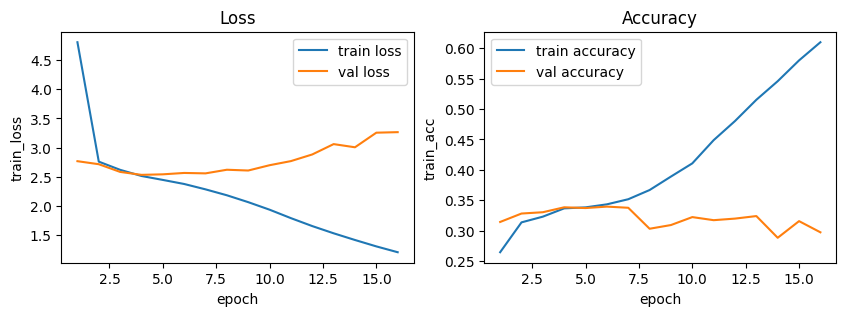

In [ ]:
# plot loss and accuracy with subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 3))

sns.lineplot(x="epoch", y="train_loss", data=df, ax=axs[0], label="train loss")
sns.lineplot(x="epoch", y="val_loss", data=df, ax=axs[0], label="val loss")
axs[0].set_title("Loss")

sns.lineplot(x="epoch", y="train_acc", data=df, ax=axs[1], label="train accuracy")
sns.lineplot(x="epoch", y="val_acc", data=df, ax=axs[1], label="val accuracy")
axs[1].set_title("Accuracy")

In [ ]:
#training the model on the entire training set for test assessment

model = RegConvNN()
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
history = []
BATCH_SIZE = 128
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


train_dataset = AlbumDataset(image_paths = X_train, classes = y_train)
test_dataset = AlbumDataset(image_paths = X_test, classes = y_test) #test transforms are applied, if any

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True
)

test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False
)


In [ ]:
for i in range(1, 7):
    h = train(
        model, device, train_loader, optimizer, criterion, i, val_loader=None
    )
    history.append(h)

Epoch    1    | Training Loss: 5.070084    | Training Accuracy: 0.225713
Epoch    2    | Training Loss: 2.738372    | Training Accuracy: 0.301138
Epoch    3    | Training Loss: 2.468265    | Training Accuracy: 0.335572
Epoch    4    | Training Loss: 2.347143    | Training Accuracy: 0.349927
Epoch    5    | Training Loss: 2.264436    | Training Accuracy: 0.357837
Epoch    6    | Training Loss: 2.170301    | Training Accuracy: 0.372124


In [ ]:
test_loss, test_acc = test(model, device, test_loader, criterion, 1)
print(f"Test Loss: {test_loss:.5f} | Test Accuracy: {test_acc:.5f}")

Test Loss: 2.46704 | Test Accuracy: 0.34450


In [ ]:
model.eval()
preds = []
labels = []
for images, labels_batch in test_loader:

    model.cuda()
    preds_batch = model(images.cuda())

    preds.append(preds_batch.cpu().detach().numpy())
    labels.append(labels_batch.cpu().detach().numpy())

preds = np.concatenate(preds)
labels = np.concatenate(labels)

preds = np.argmax(preds, axis=1)
labels = np.array(labels)

In [ ]:
confusion_matrix = np.zeros((len(set(labels)), len(set(labels))))
for i in range(len(preds)):
    confusion_matrix[preds[i], labels[i]] += 1

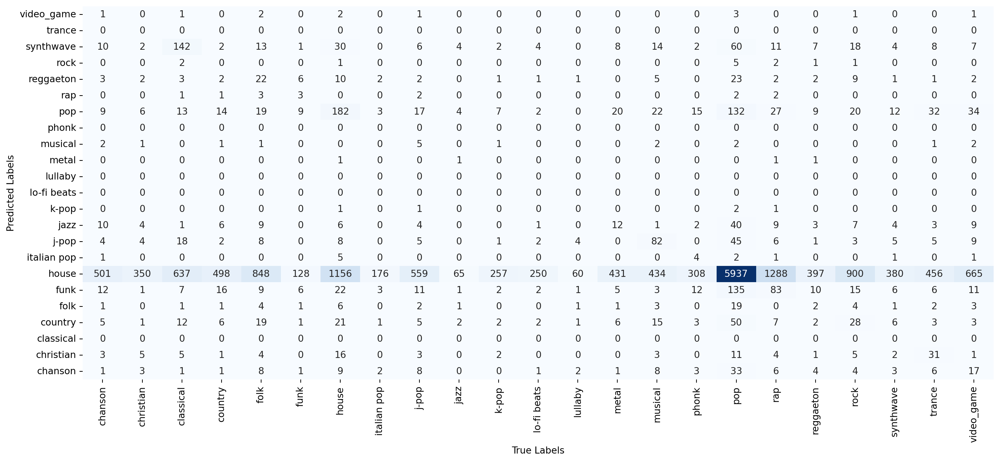

In [ ]:
plt.figure(figsize=(15, 7), dpi=190)
sns.heatmap(
    confusion_matrix,
    annot=True,
    fmt=".0f",
    cmap="Blues",
    cbar=False,
    xticklabels=[index_to_class[x] for x in range(23)],   # [0,1,2]
    yticklabels=[index_to_class[x] for x in range(22,-1,-1)], # [22,21..]
)

plt.xlabel("True Labels")
plt.ylabel("Predicted Labels")
plt.tight_layout()
plt.show()